In [2]:
%pip install numpy pandas matplotlib seaborn scikit-learn catboost lightgbm

  Using cached numpy-2.3.3-cp312-cp312-win_amd64.whl.metadata (60 kB)
  Using cached pandas-2.3.3-cp312-cp312-win_amd64.whl.metadata (19 kB)
  Using cached matplotlib-3.10.6-cp312-cp312-win_amd64.whl.metadata (11 kB)
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2025.2-py2.py3-none-any.whl.metadata (1.4 kB)
   ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
   --------- ------------------------------ 3.1/12.8 MB 20.5 MB/s eta 0:00:01
   ------------------------ --------------- 7.9/12.8 MB 22.1 MB/s eta 0:00:01
   ------------------------------ --------- 9.7/12.8 MB 16.8 MB/s eta 0:00:01
   ---------------------------------- ----- 11.0/12.8 MB 14.3 MB/s eta 0:00:01
   ---------------------------------------  12.6/12.8 MB 12.5 MB/s eta 0:00:01
   ---------------------------------------- 12.8/12.8 MB 11.6 MB/s  0:00:01
   ---------------------------------------- 0.0

In [2]:
import pandas as pd
import numpy as np
import os
for dirname, _, filenames in os.walk('data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as mp
import seaborn as sn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import warnings as w
w.filterwarnings('ignore')

data\air_quality\delhiaqi.csv


In [4]:
df = pd.read_csv("data\\air_quality\\delhiaqi.csv")
df.head()

,date,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,2023-01-01 00:00:00,1655.58,1.66,39.41,5.90,17.88,169.29,194.64,5.83
1,2023-01-01 01:00:00,1869.20,6.82,42.16,1.99,22.17,182.84,211.08,7.66
2,2023-01-01 02:00:00,2510.07,27.72,43.87,0.02,30.04,220.25,260.68,11.40
3,2023-01-01 03:00:00,3150.94,55.43,44.55,0.85,35.76,252.90,304.12,13.55
4,2023-01-01 04:00:00,3471.37,68.84,45.24,5.45,39.10,266.36,322.80,14.19


In [5]:
df.isna().sum()

date     0
co       0
no       0
no2      0
o3       0
so2      0
pm2_5    0
pm10     0
nh3      0
dtype: int64

In [6]:
df.drop('date', axis=1, inplace=True)
df.head()

,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,1655.58,1.66,39.41,5.90,17.88,169.29,194.64,5.83
1,1869.20,6.82,42.16,1.99,22.17,182.84,211.08,7.66
2,2510.07,27.72,43.87,0.02,30.04,220.25,260.68,11.40
3,3150.94,55.43,44.55,0.85,35.76,252.90,304.12,13.55
4,3471.37,68.84,45.24,5.45,39.10,266.36,322.80,14.19


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 561 entries, 0 to 560
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   co      561 non-null    float64
 1   no      561 non-null    float64
 2   no2     561 non-null    float64
 3   o3      561 non-null    float64
 4   so2     561 non-null    float64
 5   pm2_5   561 non-null    float64
 6   pm10    561 non-null    float64
 7   nh3     561 non-null    float64
dtypes: float64(8)
memory usage: 35.2 KB


In [ ]:
df.duplicated().sum()

np.int64(0)

<Axes: >

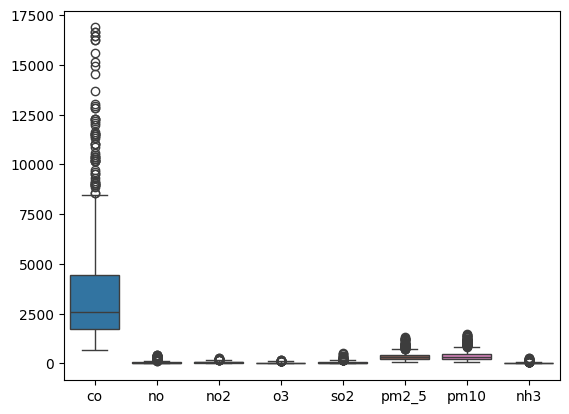

In [9]:
sn.boxplot(df)

In [10]:
df['co'].max()

np.float64(16876.22)

In [11]:
df['co_to_pm2_5'] = df['co'] / df['pm2_5']
df['no_to_pm2_5'] = df['no'] / df['pm2_5']
df['nox'] = df['no'] + df['no2']
df['nox_to_pm2_5'] = df['nox'] / df['pm2_5']
df['total_pollutant'] = df['co'] + df['no'] + df['no2'] + df['o3'] + df['so2'] + df['pm2_5'] + df['pm10'] + df['nh3']
df['avg_pollutant'] = df['total_pollutant'] / 8
df['pm2_5_to_pm10'] = df['pm2_5'] / df['pm10']

df['co_no_interaction'] = df['co'] * df['no']
df['so2_o3_interaction'] = df['so2'] * df['o3']

df['co_squared'] = df['co'] ** 2
df['log_pm2_5'] = np.log1p(df['pm2_5'])

df['high_pm2_5'] = np.where(df['pm2_5'] > 100, 1, 0)
df['high_co'] = np.where(df['co'] > 2000, 1, 0)

In [13]:
df.head()

,co,no,no2,o3,so2,pm2_5,pm10,nh3,co_to_pm2_5,no_to_pm2_5,nox,nox_to_pm2_5,total_pollutant,avg_pollutant,pm2_5_to_pm10,co_no_interaction,so2_o3_interaction,co_squared,log_pm2_5,high_pm2_5,high_co
0,1655.58,1.66,39.41,5.90,17.88,169.29,194.64,5.83,9.779550,0.009806,41.07,0.242601,2090.19,261.27375,0.869760,2748.2628,105.4920,2.740945e+06,5.137503,1,0
1,1869.20,6.82,42.16,1.99,22.17,182.84,211.08,7.66,10.223146,0.037300,48.98,0.267884,2343.92,292.99000,0.866212,12747.9440,44.1183,3.493909e+06,5.214066,1,0
2,2510.07,27.72,43.87,0.02,30.04,220.25,260.68,11.40,11.396459,0.125857,71.59,0.325040,3104.05,388.00625,0.844906,69579.1404,0.6008,6.300451e+06,5.399293,1,1
3,3150.94,55.43,44.55,0.85,35.76,252.90,304.12,13.55,12.459233,0.219178,99.98,0.395334,3858.10,482.26250,0.831580,174656.6042,30.3960,9.928423e+06,5.536940,1,1
4,3471.37,68.84,45.24,5.45,39.10,266.36,322.80,14.19,13.032625,0.258447,114.08,0.428293,4233.35,529.16875,0.825155,238969.1108,213.0950,1.205041e+07,5.588596,1,1


In [19]:
df.describe()

,co,no,no2,o3,so2,pm2_5,pm10,nh3,co_to_pm2_5,no_to_pm2_5,nox,nox_to_pm2_5,total_pollutant,avg_pollutant,pm2_5_to_pm10,co_no_interaction,so2_o3_interaction,co_squared,log_pm2_5,high_pm2_5,high_co
count,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,5.610000e+02,561.000000,5.610000e+02,561.000000,561.000000,561.000000
mean,3814.942210,51.181979,75.292496,30.141943,64.655936,358.256364,420.988414,26.425062,10.051132,0.096212,126.474474,0.332401,4841.884403,605.235550,0.854294,4.574153e+05,1829.042537,2.495355e+07,5.718090,0.983957,0.664884
std,3227.744681,83.904476,42.473791,39.979405,61.073080,227.359117,271.287026,36.563094,2.780507,0.104266,117.681398,0.146758,3878.903916,484.862989,0.061645,1.110518e+06,3130.799087,4.687142e+07,0.567151,0.125752,0.472452
min,654.220000,0.000000,13.370000,0.000000,5.250000,60.100000,69.080000,0.630000,4.228392,0.000000,15.860000,0.079631,967.760000,120.970000,0.637316,0.000000e+00,0.000000,4.280038e+05,4.112512,0.000000,0.000000
25%,1708.980000,3.380000,44.550000,0.070000,28.130000,204.450000,240.900000,8.230000,8.017024,0.015214,50.040000,0.223039,2333.030000,291.628750,0.819866,4.422527e+03,2.708400,2.920613e+06,5.325203,1.000000,0.000000
50%,2590.180000,13.300000,63.750000,11.800000,47.210000,301.170000,340.900000,14.820000,9.801783,0.059880,87.590000,0.320751,3392.160000,424.020000,0.860086,3.091606e+04,397.780800,6.709032e+06,5.710990,1.000000,1.000000
75%,4432.680000,59.010000,97.330000,47.210000,77.250000,416.650000,482.570000,26.350000,11.952641,0.155196,153.480000,0.420161,5517.730000,689.716250,0.900742,2.535439e+05,1969.873000,1.964865e+07,6.034644,1.000000,1.000000
max,16876.220000,425.580000,263.210000,164.510000,511.170000,1310.200000,1499.270000,267.510000,18.696980,0.528199,674.480000,0.850008,20822.830000,2602.853750,0.972669,7.000353e+06,18870.530400,2.848068e+08,7.178698,1.000000,1.000000


In [15]:
df.shape

(561, 21)

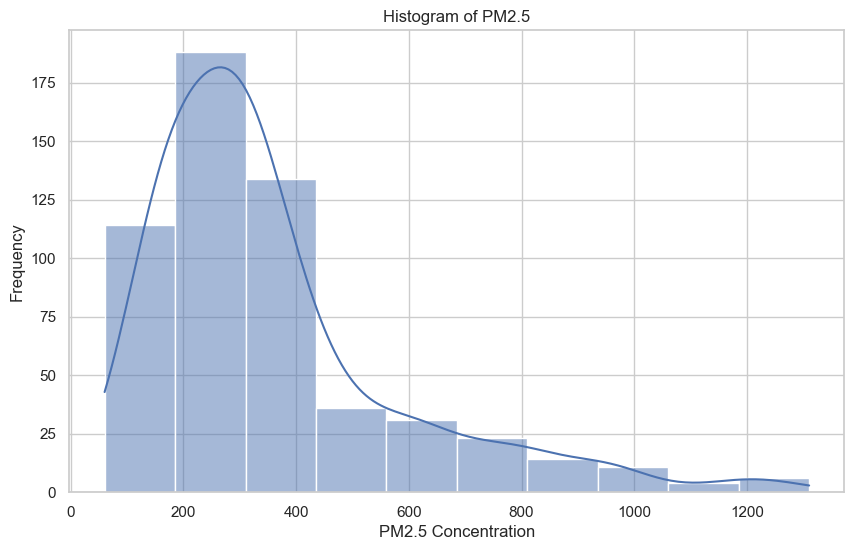

In [16]:
sn.set_theme(style='whitegrid')

mp.figure(figsize=(10, 6))
sn.histplot(df['pm2_5'], bins=10, kde=True)
mp.title('Histogram of PM2.5')
mp.xlabel('PM2.5 Concentration')
mp.ylabel('Frequency')
mp.show()

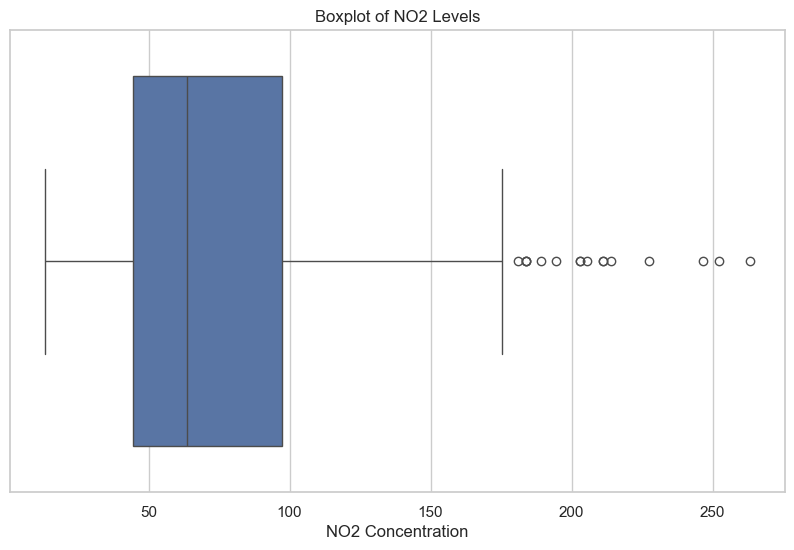

In [17]:
mp.figure(figsize=(10, 6))
sn.boxplot(x=df['no2'])
mp.title('Boxplot of NO2 Levels')
mp.xlabel('NO2 Concentration')
mp.show()

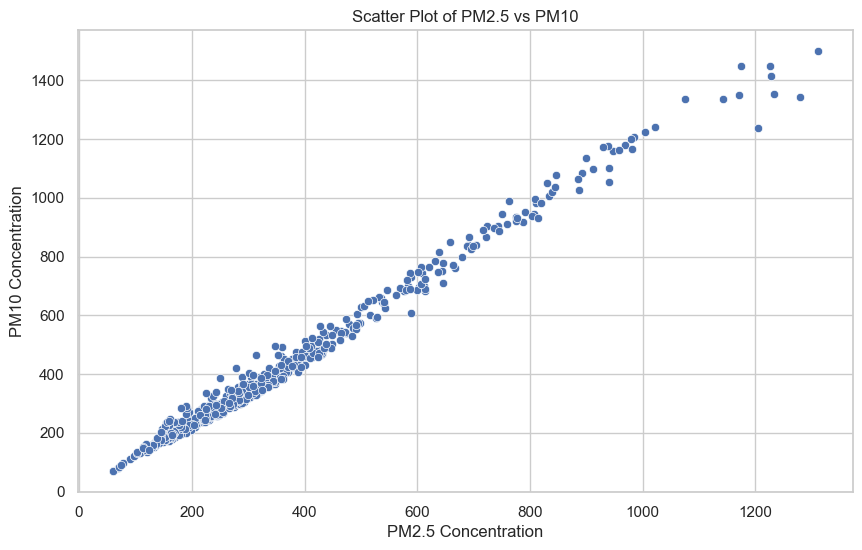

In [20]:
mp.figure(figsize=(10, 6))
sn.scatterplot(x='pm2_5', y='pm10', data=df)
mp.title('Scatter Plot of PM2.5 vs PM10')
mp.xlabel('PM2.5 Concentration')
mp.ylabel('PM10 Concentration')
mp.show()

<Figure size 1000x1000 with 0 Axes>

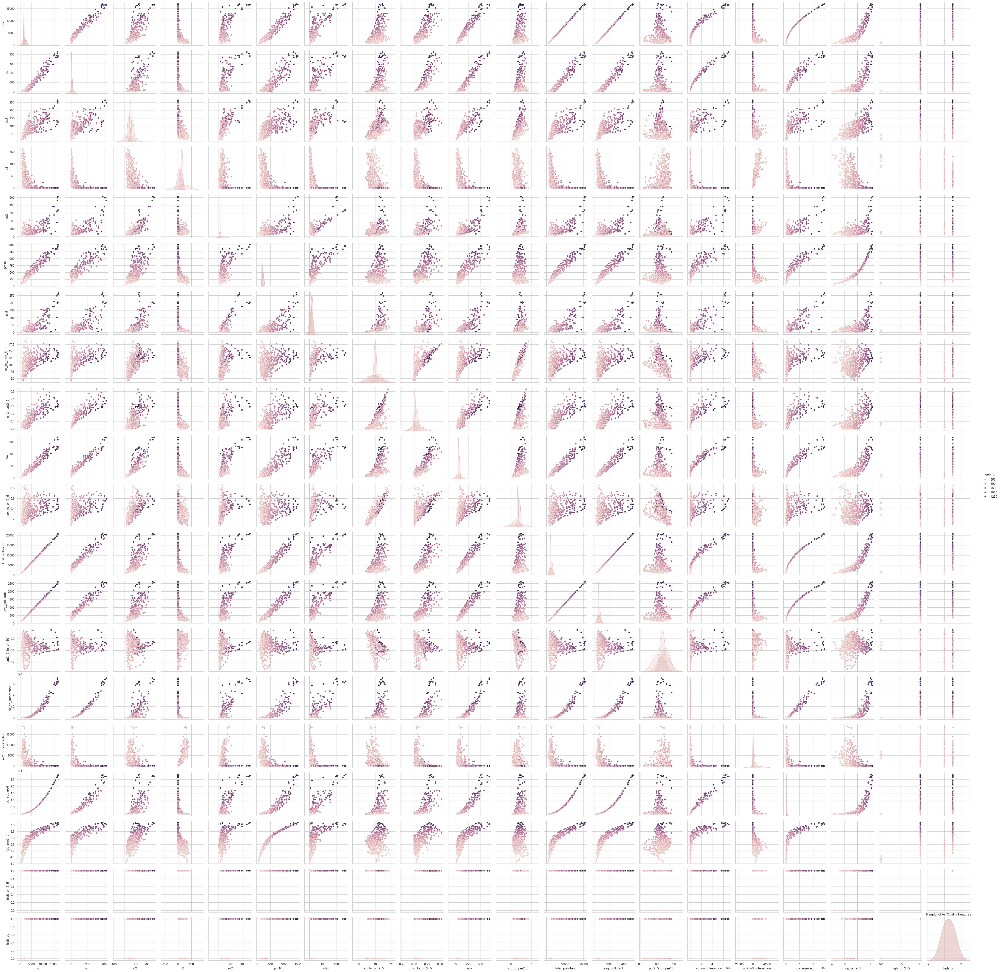

In [21]:
mp.figure(figsize=(10, 10))
sn.pairplot(df,hue='pm2_5')
mp.title('Pairplot of Air Quality Features')
mp.show()

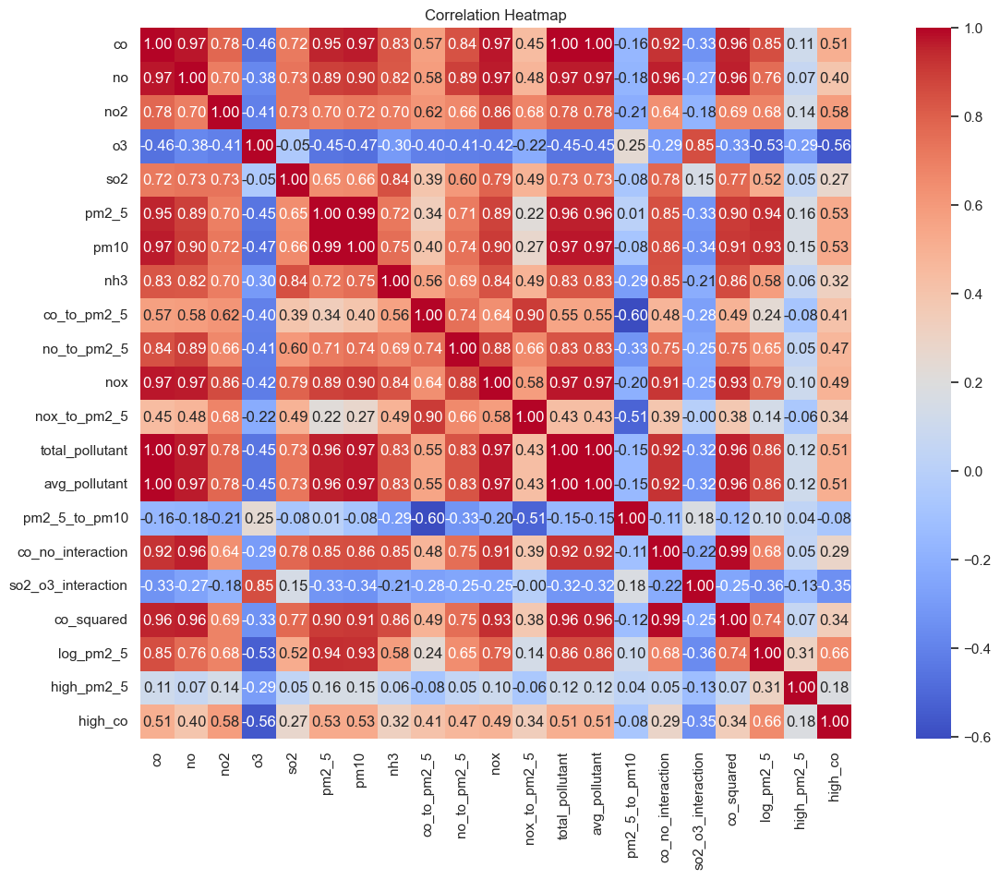

In [22]:
mp.figure(figsize=(18, 10))
correlation_matrix = df.corr()
sn.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
mp.title('Correlation Heatmap')
mp.show()

In [23]:
df.corr()

,co,no,no2,o3,so2,pm2_5,pm10,nh3,co_to_pm2_5,no_to_pm2_5,nox,nox_to_pm2_5,total_pollutant,avg_pollutant,pm2_5_to_pm10,co_no_interaction,so2_o3_interaction,co_squared,log_pm2_5,high_pm2_5,high_co
co,1.000000,0.969740,0.776402,-0.463082,0.716831,0.953083,0.966801,0.826299,0.571188,0.842384,0.971626,0.446761,0.999390,0.999390,-0.164276,0.921593,-0.330827,0.956072,0.854836,0.114223,0.510993
no,0.969740,1.000000,0.702201,-0.377813,0.734503,0.888810,0.903339,0.823638,0.582272,0.891247,0.966420,0.477967,0.966978,0.966978,-0.175091,0.958196,-0.265073,0.959157,0.761042,0.071019,0.396188
no2,0.776402,0.702201,1.000000,-0.407177,0.734961,0.698696,0.720050,0.700254,0.615256,0.664272,0.861577,0.676048,0.777495,0.777495,-0.209179,0.640837,-0.179916,0.685124,0.683549,0.141416,0.581312
o3,-0.463082,-0.377813,-0.407177,1.000000,-0.049158,-0.450458,-0.468477,-0.299663,-0.404577,-0.411510,-0.416332,-0.221113,-0.450435,-0.450435,0.245965,-0.291577,0.853580,-0.334522,-0.530081,-0.286500,-0.557284
so2,0.716831,0.734503,0.734961,-0.049158,1.000000,0.648996,0.658325,0.843635,0.394149,0.599190,0.788950,0.488150,0.727705,0.727705,-0.075006,0.775582,0.154030,0.774288,0.523555,0.046661,0.268976
pm2_5,0.953083,0.888810,0.698696,-0.450458,0.648996,1.000000,0.994088,0.720303,0.339214,0.706292,0.885878,0.221863,0.960469,0.960469,0.011554,0.848943,-0.326101,0.900913,0.936834,0.157694,0.526110
pm10,0.966801,0.903339,0.720050,-0.468477,0.658325,0.994088,1.000000,0.754468,0.395518,0.738290,0.903944,0.269413,0.972782,0.972782,-0.083353,0.855264,-0.338680,0.908786,0.926504,0.154225,0.529972
nh3,0.826299,0.823638,0.700254,-0.299663,0.843635,0.720303,0.754468,1.000000,0.562425,0.690223,0.839974,0.486820,0.827678,0.827678,-0.288116,0.847246,-0.212282,0.861798,0.581688,0.055497,0.319833
co_to_pm2_5,0.571188,0.582272,0.615256,-0.404577,0.394149,0.339214,0.395518,0.562425,1.000000,0.743727,0.637207,0.902585,0.549516,0.549516,-0.603876,0.478566,-0.278078,0.486608,0.238452,-0.081886,0.406933
no_to_pm2_5,0.842384,0.891247,0.664272,-0.411510,0.599190,0.706292,0.738290,0.690223,0.743727,1.000000,0.875192,0.655456,0.832256,0.832256,-0.328144,0.754428,-0.249168,0.752667,0.648935,0.048602,0.473643


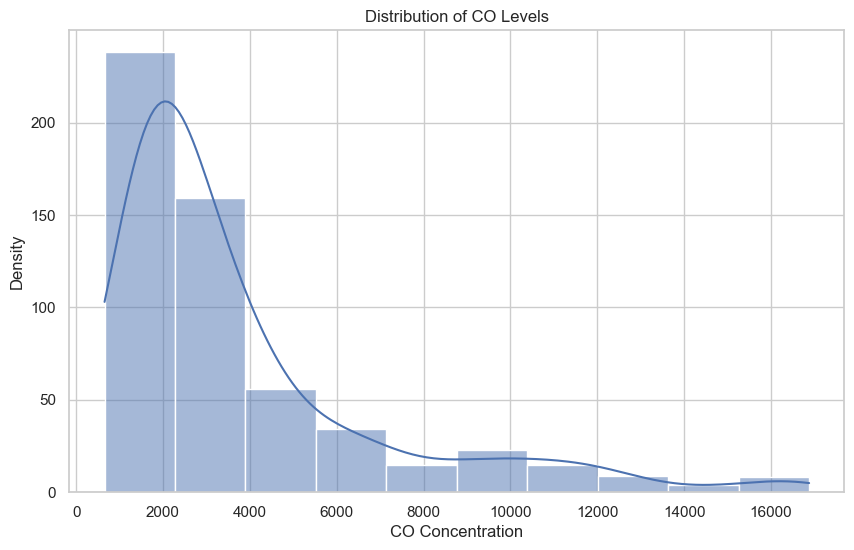

In [24]:
mp.figure(figsize=(10, 6))
sn.histplot(df['co'], bins=10, kde=True)
mp.title('Distribution of CO Levels')
mp.xlabel('CO Concentration')
mp.ylabel('Density')
mp.show()

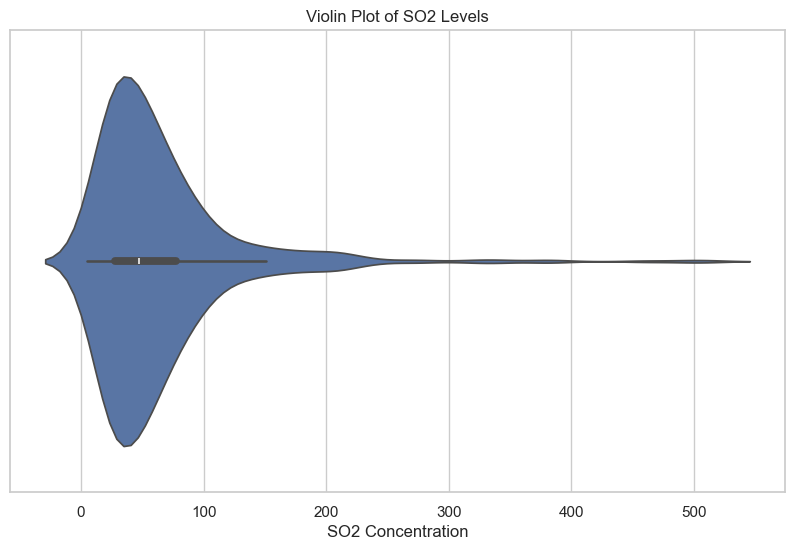

In [25]:
mp.figure(figsize=(10, 6))
sn.violinplot(x=df['so2'])
mp.title('Violin Plot of SO2 Levels')
mp.xlabel('SO2 Concentration')
mp.show()

<Figure size 1000x600 with 0 Axes>

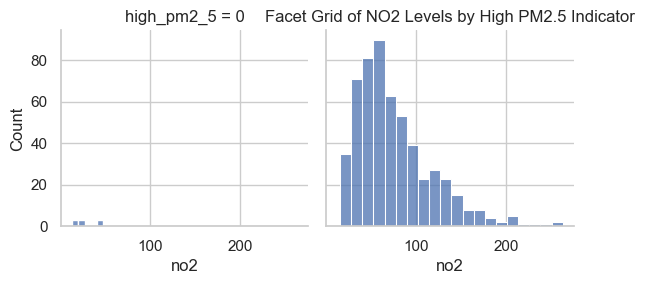

In [26]:
mp.figure(figsize=(10, 6))
g = sn.FacetGrid(df, col='high_pm2_5')
g.map(sn.histplot, 'no2')
mp.title('Facet Grid of NO2 Levels by High PM2.5 Indicator')
mp.show()

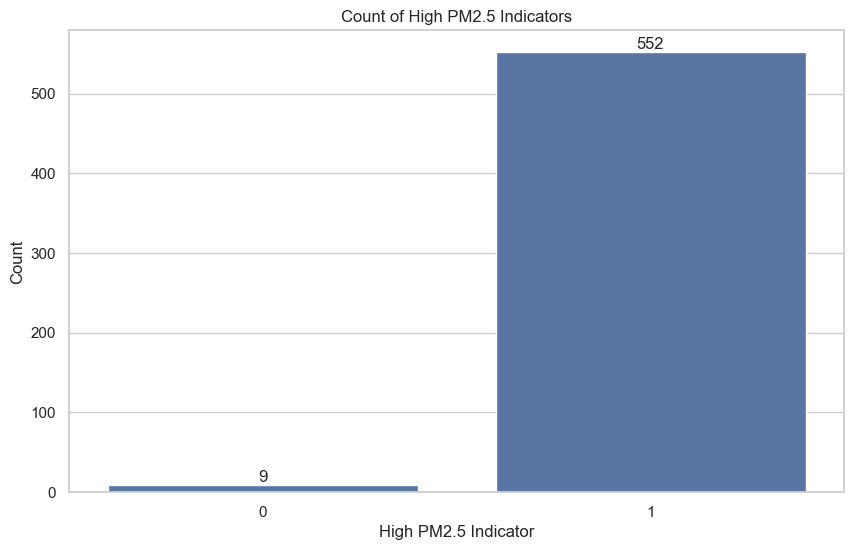

In [ ]:
mp.figure(figsize=(10, 6))
ax = sn.countplot(x='high_pm2_5', data=df)

for i in ax.containers:
    ax.bar_label(i)

mp.title('Count of High PM2.5 Indicators')
mp.xlabel('High PM2.5 Indicator')
mp.ylabel('Count')
mp.show()


<Figure size 1000x600 with 0 Axes>

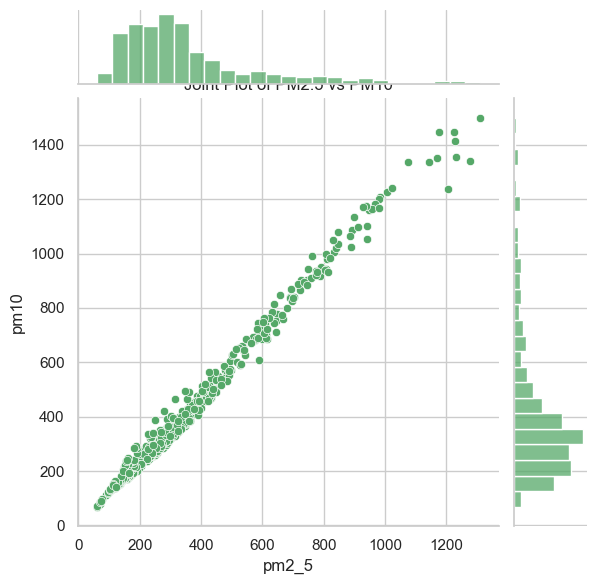

In [30]:
mp.figure(figsize=(10, 6))
sn.jointplot(x='pm2_5', y='pm10', data=df, kind='scatter', color='g')
mp.title('Joint Plot of PM2.5 vs PM10')
mp.show()

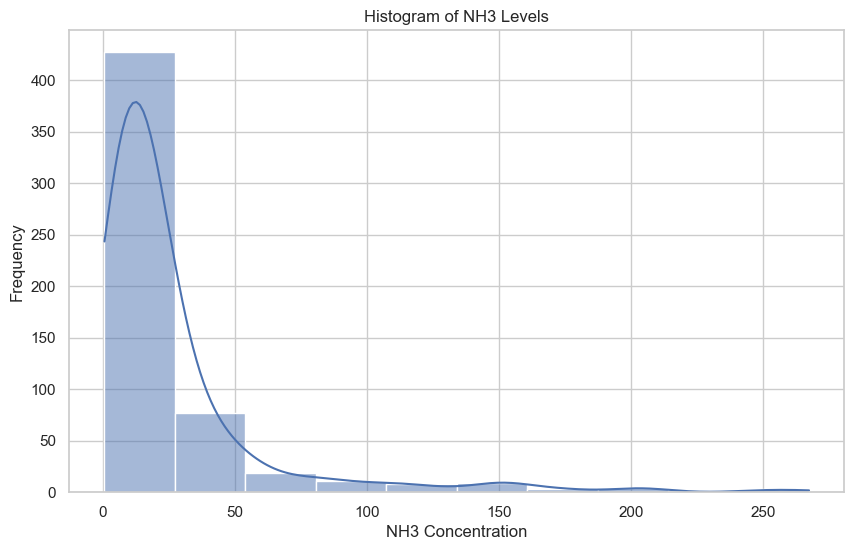

In [31]:
mp.figure(figsize=(10, 6))
sn.histplot(df['nh3'], bins=10, kde=True)
mp.title('Histogram of NH3 Levels')
mp.xlabel('NH3 Concentration')
mp.ylabel('Frequency')
mp.show()

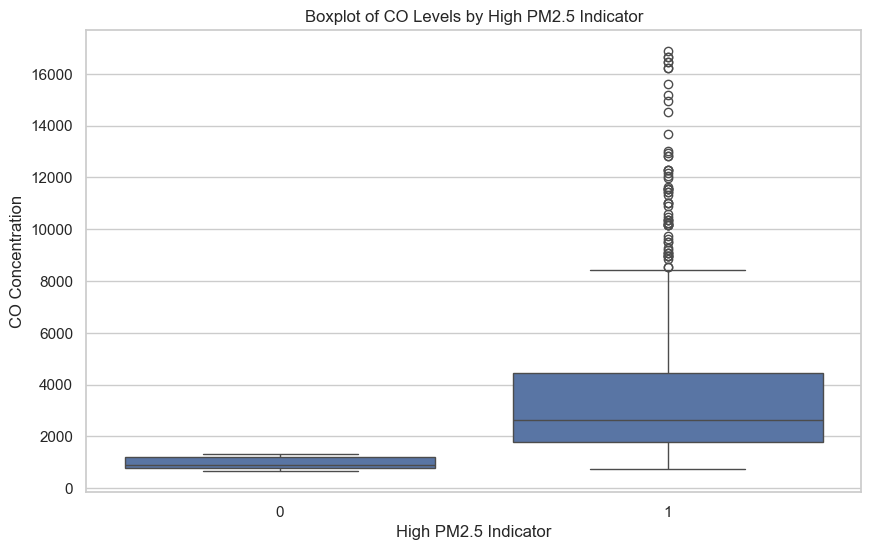

In [32]:
mp.figure(figsize=(10, 6))
sn.boxplot(x='high_pm2_5', y='co', data=df)
mp.title('Boxplot of CO Levels by High PM2.5 Indicator')
mp.xlabel('High PM2.5 Indicator')
mp.ylabel('CO Concentration')
mp.show()

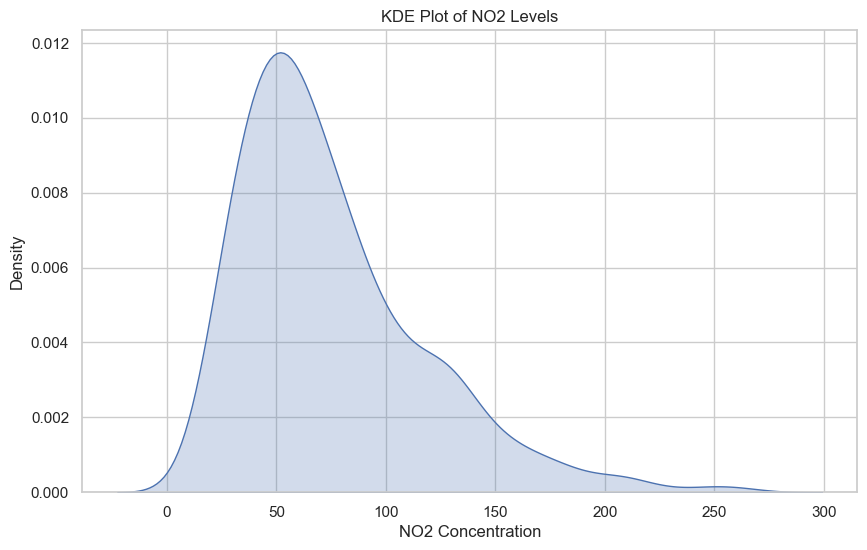

In [33]:
mp.figure(figsize=(10, 6))
sn.kdeplot(df['no2'], shade=True)
mp.title('KDE Plot of NO2 Levels')
mp.xlabel('NO2 Concentration')
mp.ylabel('Density')
mp.show()

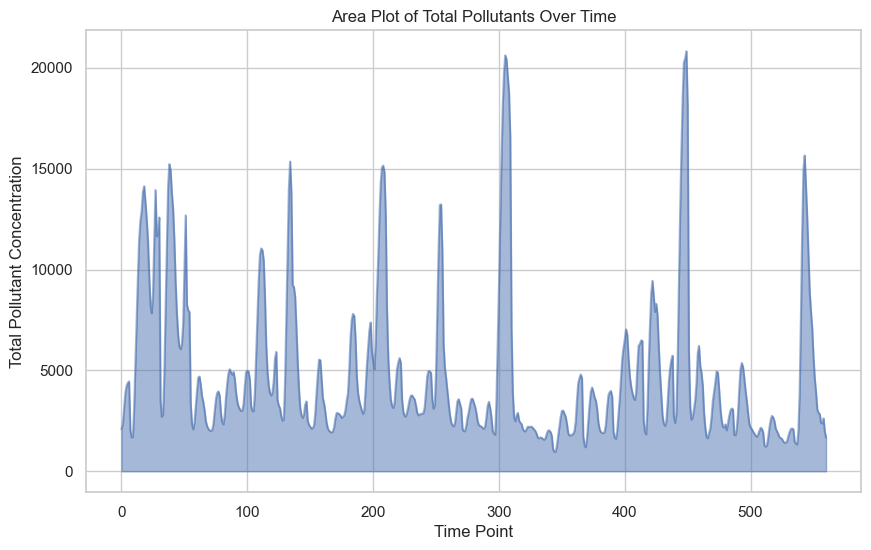

In [34]:
mp.figure(figsize=(10, 6))
df['total_pollutant'].plot(kind='area', alpha=0.5)
mp.title('Area Plot of Total Pollutants Over Time')
mp.xlabel('Time Point')
mp.ylabel('Total Pollutant Concentration')
mp.show()

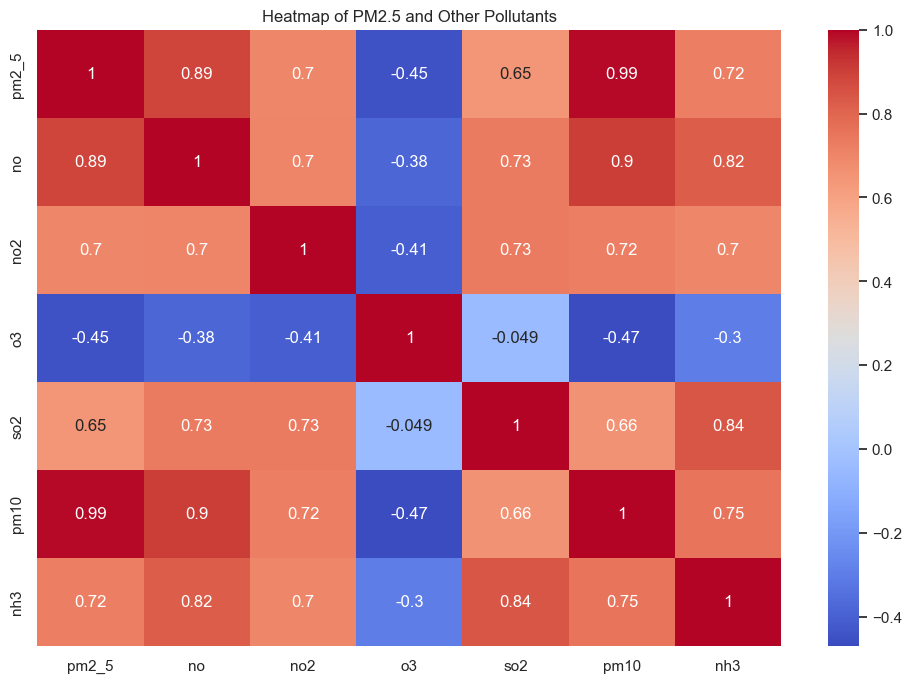

In [35]:
mp.figure(figsize=(12, 8))
sn.heatmap(df[['pm2_5', 'no', 'no2', 'o3', 'so2', 'pm10', 'nh3']].corr(), annot=True, cmap='coolwarm')
mp.title('Heatmap of PM2.5 and Other Pollutants')
mp.show()

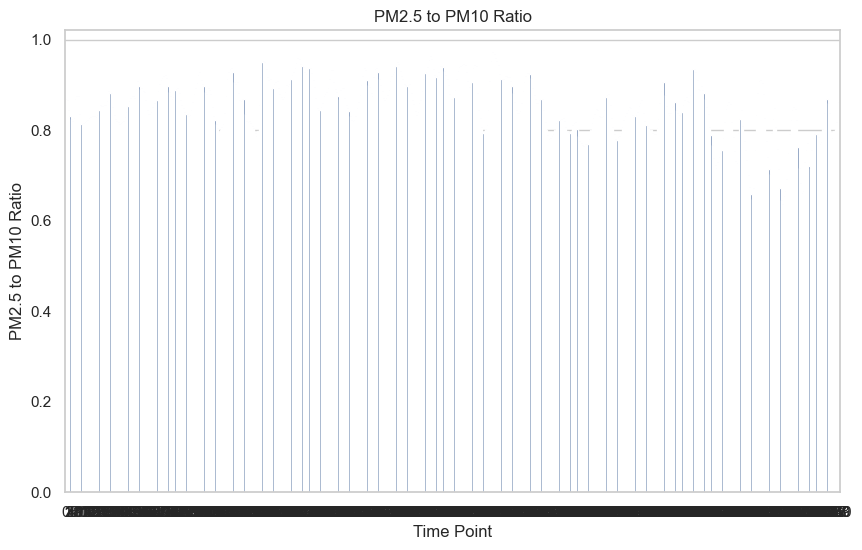

In [36]:
mp.figure(figsize=(10, 6))
sn.barplot(x=df.index, y='pm2_5_to_pm10', data=df)
mp.title('PM2.5 to PM10 Ratio')
mp.xlabel('Time Point')
mp.ylabel('PM2.5 to PM10 Ratio')
mp.show()

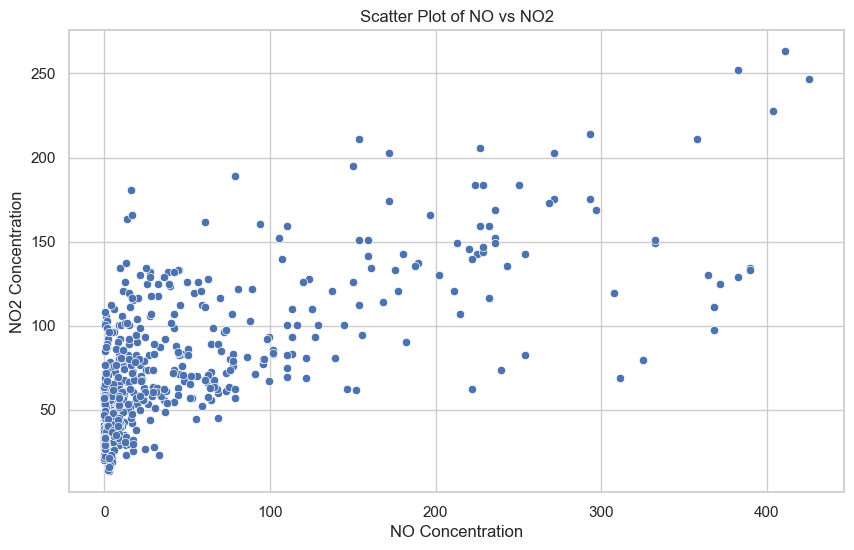

In [39]:
mp.figure(figsize=(10, 6))
sn.scatterplot(x='no', y='no2', data=df)
mp.title('Scatter Plot of NO vs NO2')
mp.xlabel('NO Concentration')
mp.ylabel('NO2 Concentration')
mp.show()

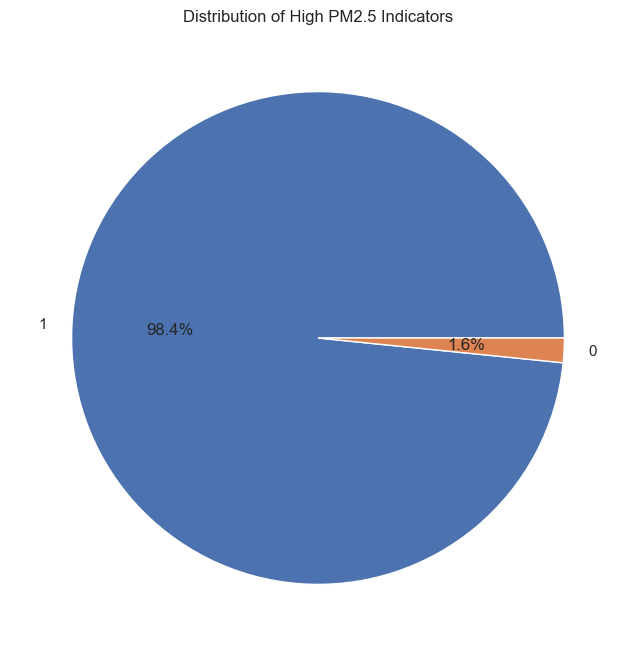

In [40]:
mp.figure(figsize=(8, 8))
df['high_pm2_5'].value_counts().plot(kind='pie', autopct='%1.1f%%')
mp.title('Distribution of High PM2.5 Indicators')
mp.ylabel('')
mp.show()

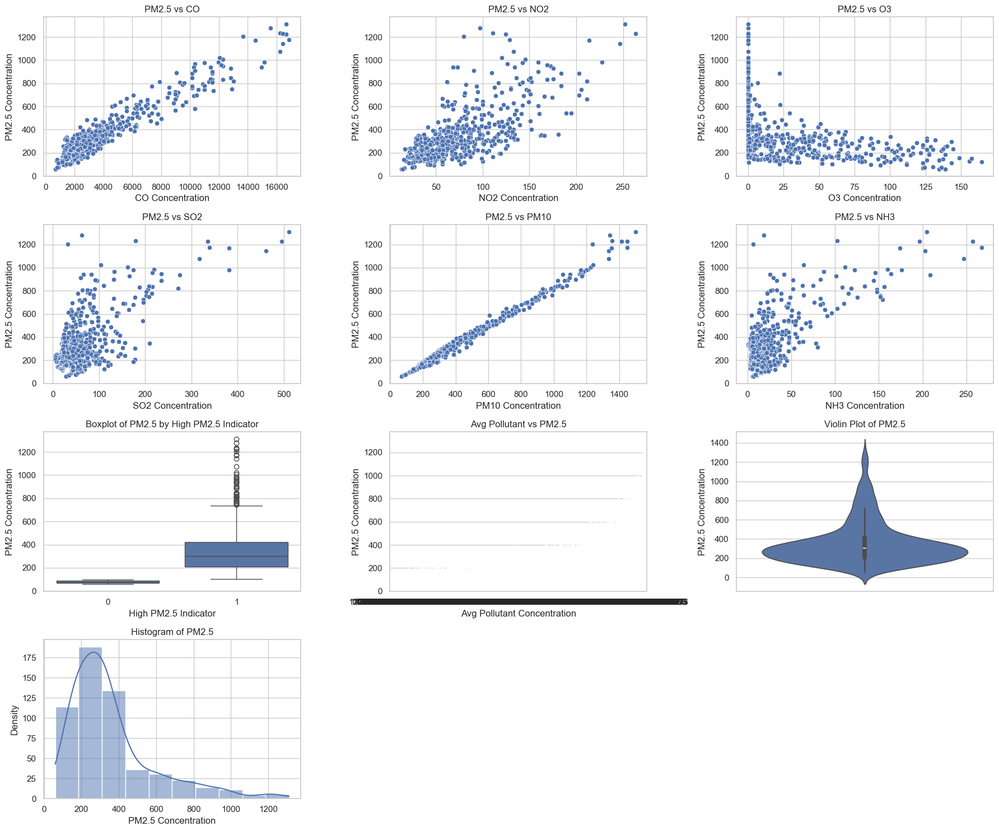

In [42]:
sn.set_theme(style="whitegrid")

mp.figure(figsize=(18, 15))

mp.subplot(4, 3, 1)
sn.scatterplot(x='co', y='pm2_5', data=df)

mp.title('PM2.5 vs CO')
mp.xlabel('CO Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 2)
sn.scatterplot(x='no2', y='pm2_5', data=df)
mp.title('PM2.5 vs NO2')
mp.xlabel('NO2 Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 3)
sn.scatterplot(x='o3', y='pm2_5', data=df)
mp.title('PM2.5 vs O3')
mp.xlabel('O3 Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 4)
sn.scatterplot(x='so2', y='pm2_5', data=df)
mp.title('PM2.5 vs SO2')
mp.xlabel('SO2 Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 5)
sn.scatterplot(x='pm10', y='pm2_5', data=df)
mp.title('PM2.5 vs PM10')
mp.xlabel('PM10 Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 6)
sn.scatterplot(x='nh3', y='pm2_5', data=df)
mp.title('PM2.5 vs NH3')
mp.xlabel('NH3 Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 7)
sn.boxplot(x='high_pm2_5', y='pm2_5', data=df)
mp.title('Boxplot of PM2.5 by High PM2.5 Indicator')
mp.xlabel('High PM2.5 Indicator')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 8)
sn.barplot(x='avg_pollutant', y='pm2_5', data=df)
mp.title('Avg Pollutant vs PM2.5')
mp.xlabel('Avg Pollutant Concentration')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 9)
sn.violinplot(y='pm2_5', data=df)
mp.title('Violin Plot of PM2.5')
mp.ylabel('PM2.5 Concentration')

mp.subplot(4, 3, 10)
sn.histplot(df['pm2_5'], bins=10, kde=True)
mp.title('Histogram of PM2.5')
mp.xlabel('PM2.5 Concentration')
mp.ylabel('Density')

# Adjust layout
mp.tight_layout()
mp.show()

# Preprocessing

In [44]:
x=df.drop('pm2_5',axis=1)
y=df['pm2_5']

In [45]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(x)

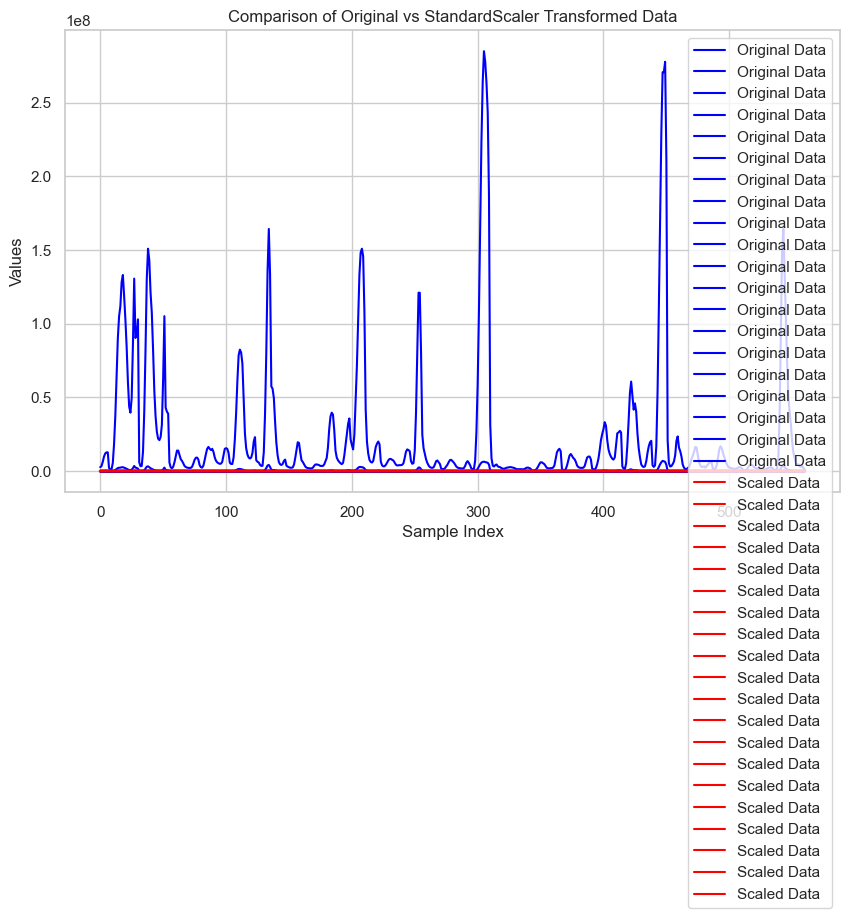

In [52]:


mp.figure(figsize=(10, 6))
mp.plot(range(len(x)), x, label='Original Data', color='blue')
mp.plot(range(len(X_scaled)), X_scaled, label='Scaled Data', color='red')
mp.title('Comparison of Original vs StandardScaler Transformed Data')
mp.xlabel('Sample Index')
mp.ylabel('Values')
mp.legend()
mp.grid(True)
mp.show()

In [46]:
pca = PCA(n_components=14)  
X_pca = pca.fit_transform(X_scaled)

In [47]:
pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i+1}' for i in range(14)])

In [53]:
explained_variance = pca.explained_variance_ratio_

In [54]:
for i, variance in enumerate(explained_variance):
    print(f'PC{i+1}: {variance:.4f}')

PC1: 0.6154
PC2: 0.1074
PC3: 0.1043
PC4: 0.0520
PC5: 0.0415
PC6: 0.0234
PC7: 0.0217
PC8: 0.0124
PC9: 0.0080
PC10: 0.0058
PC11: 0.0040
PC12: 0.0017
PC13: 0.0012
PC14: 0.0006


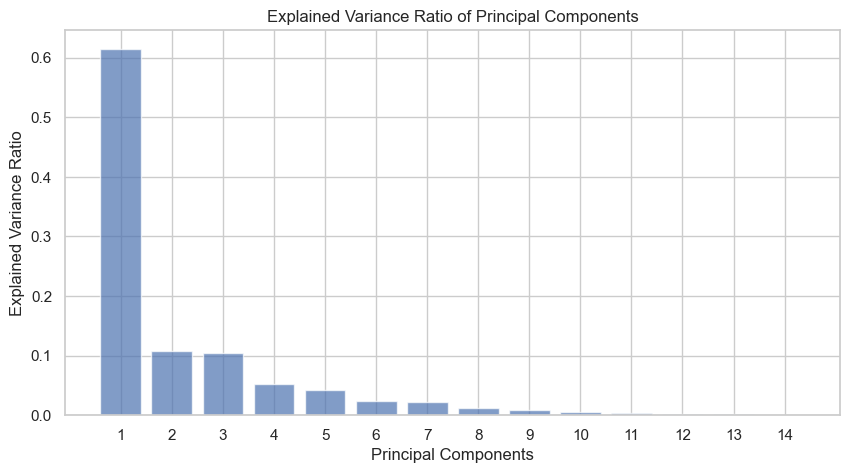

In [55]:
mp.figure(figsize=(10, 5))
mp.bar(range(1, 15), explained_variance, alpha=0.7, color='b', align='center')
mp.xlabel('Principal Components')
mp.ylabel('Explained Variance Ratio')
mp.title('Explained Variance Ratio of Principal Components')
mp.xticks(range(1, 15))
mp.show()

In [56]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,-2.570292,-0.283171,-0.608057,-0.994369,0.828549,-0.397949,0.843468,0.179765,-0.024081,-0.214692,0.317168,0.063960,-0.333868,0.008332
1,-2.239154,-0.163390,-0.731061,-0.954151,0.810500,-0.300647,0.920417,0.203397,0.136855,-0.160606,0.364029,0.080534,-0.310149,0.058042
2,-1.015385,-0.086637,-1.562909,-0.090000,-0.166274,0.277149,0.270158,-0.905101,0.113929,-0.230533,-0.009951,0.101570,-0.220749,-0.052331
3,-0.127015,0.368885,-1.740935,-0.065531,-0.172436,0.861806,0.480037,-0.948113,0.501430,-0.074203,-0.071817,0.135543,-0.098145,-0.020499
4,0.272915,0.640862,-1.747136,-0.026335,-0.175999,1.153197,0.559077,-0.966495,0.609924,0.012769,-0.115794,0.176077,-0.048605,-0.000184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
556,-2.480441,-0.276186,-0.113114,-1.041883,1.245578,-0.006999,-0.598672,0.459908,0.282365,-0.138628,-0.120829,0.108187,0.038881,0.165359
557,-2.510878,-0.084707,0.165996,-0.939584,1.224439,0.108282,-0.579885,0.336764,0.255546,0.000563,-0.175437,0.120742,0.052304,0.152622
558,-2.347060,0.013219,0.544021,-0.688887,1.082348,0.131005,-0.479570,0.356149,0.226932,0.150262,-0.083912,0.136377,0.043962,0.199271
559,-2.473172,1.389592,1.571497,0.583094,0.724779,-0.022877,0.324872,0.156320,0.490258,-0.477432,0.180088,0.066499,0.121848,-0.115940


# Training

In [57]:
X_train, X_test, y_train, y_test = train_test_split(pca_df, y, test_size=0.2, random_state=42)

In [58]:
catboost_model = CatBoostRegressor(verbose=0, random_seed=42)
lgbm_model = LGBMRegressor(random_state=42)
ridge_model = Ridge()

In [59]:
stacked_model = StackingRegressor(
    estimators=[('catboost', catboost_model), ('lgbm', lgbm_model)],
    final_estimator=ridge_model,
    cv=3, 
    n_jobs=-1
)
stacked_model.fit(X_train, y_train)

,estimators,"[('catboost', ...), ('lgbm', ...)]"
,final_estimator,Ridge()
,cv,3
,n_jobs,-1
,passthrough,False
,verbose,0
,boosting_type,'gbdt'
,num_leaves,31
,max_depth,-1
,learning_rate,0.1
,n_estimators,100


In [60]:
y_pred = stacked_model.predict(X_test)

In [61]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

Root Mean Squared Error (RMSE): 20.2831


In [62]:
r2 = r2_score(y_test, y_pred)
print(f'R² Score: {r2:.4f}')

R² Score: 0.9888


In [63]:
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
results

,Actual,Predicted
513,141.49,126.508828
342,124.87,116.762648
177,296.52,284.082726
86,361.48,392.869963
333,181.00,166.688215
...,...,...
399,358.48,367.965751
353,164.71,167.368776
33,253.57,222.147310
518,189.03,177.450036


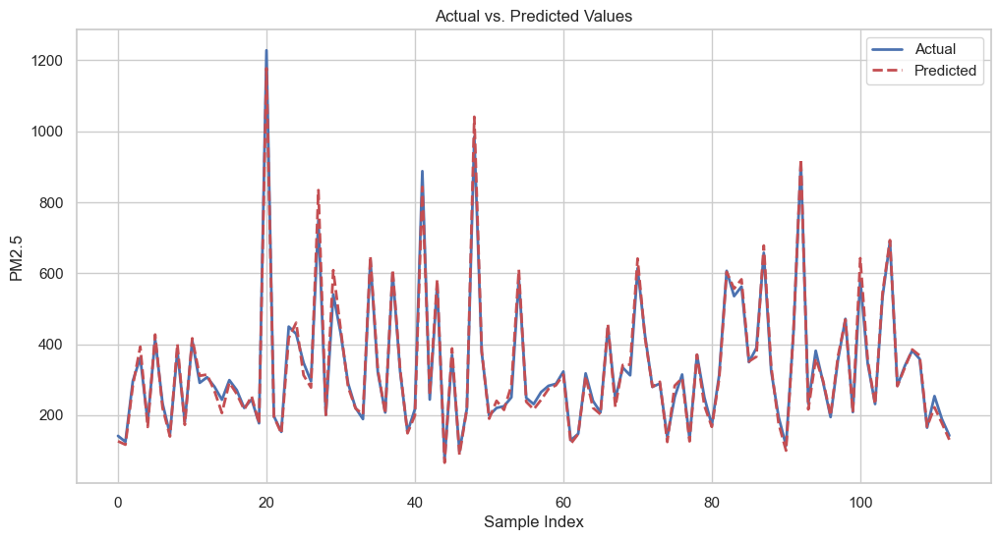

In [64]:
mp.figure(figsize=(12, 6))
mp.plot(results['Actual'].values, label='Actual', color='b', linewidth=2)
mp.plot(results['Predicted'].values, label='Predicted', color='r', linestyle='--', linewidth=2)
mp.title('Actual vs. Predicted Values')
mp.xlabel('Sample Index')
mp.ylabel('PM2.5')
mp.legend()
mp.show()

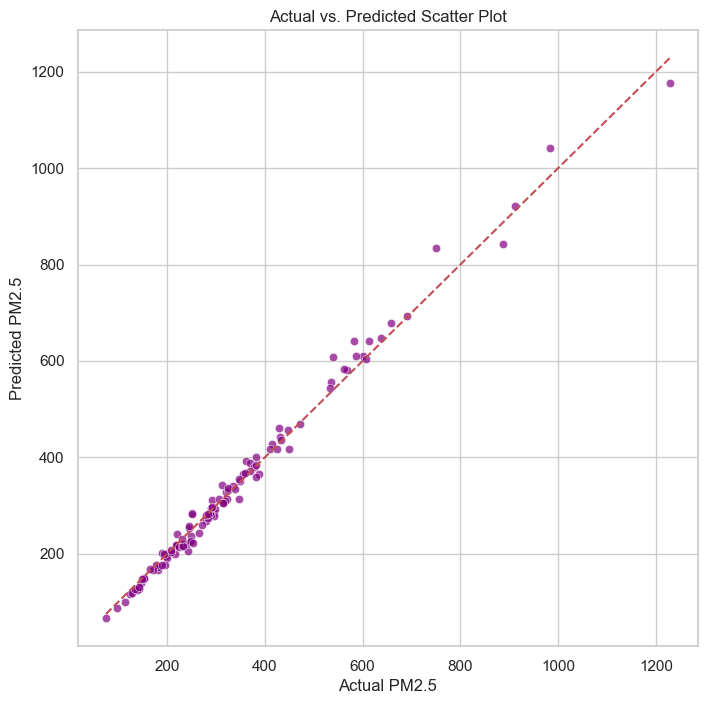

In [65]:
mp.figure(figsize=(8, 8))
sn.scatterplot(x=results['Actual'], y=results['Predicted'], alpha=0.7, color='purple')
mp.plot([results['Actual'].min(), results['Actual'].max()], [results['Actual'].min(), results['Actual'].max()], color='r', linestyle='--')
mp.title('Actual vs. Predicted Scatter Plot')
mp.xlabel('Actual PM2.5')
mp.ylabel('Predicted PM2.5')
mp.show()

# Inference

In [67]:
import pickle
with open('stacked_model.pkl', 'wb+') as f:
    pickle.dump(stacked_model, f)
